In [ ]:
import gdown
import zipfile
import os
import cv2
import matplotlib.pyplot as plt

In [ ]:
file_id = "1KCKfyIGbQi8a7bIYta3LM8dFStxVzVX-"
output = "dataset.zip"  # Change this to the appropriate file name

gdown.download(f"https://drive.google.com/uc?id={file_id}", output, quiet=False)

Downloading...
From (original): https://drive.google.com/uc?id=1KCKfyIGbQi8a7bIYta3LM8dFStxVzVX-
From (redirected): https://drive.google.com/uc?id=1KCKfyIGbQi8a7bIYta3LM8dFStxVzVX-&confirm=t&uuid=957b7f07-09b9-4909-82cf-2d4a8d158950
To: /content/dataset.zip
100%|██████████| 1.78G/1.78G [00:25<00:00, 70.3MB/s]


'dataset.zip'

In [ ]:
# Step 2: Extract the ZIP File
extract_to = "dataset"
os.makedirs(extract_to, exist_ok=True)
output = "/content/dataset.zip"
with zipfile.ZipFile(output, 'r') as zip_ref:
    zip_ref.extractall(extract_to)

print(f"Extracted dataset to {extract_to}")

Extracted dataset to dataset


In [ ]:
!find /content/dataset -type f | head -10

/content/dataset/Shop DataSet/non shop lifters/shop_lifter_n_160.mp4
/content/dataset/Shop DataSet/non shop lifters/shop_lifter_n_99.mp4
/content/dataset/Shop DataSet/non shop lifters/shop_lifter_n_205.mp4
/content/dataset/Shop DataSet/non shop lifters/shop_lifter_n_27_1.mp4
/content/dataset/Shop DataSet/non shop lifters/shop_lifter_n_24.mp4
/content/dataset/Shop DataSet/non shop lifters/shop_lifter_n_145_1.mp4
/content/dataset/Shop DataSet/non shop lifters/shop_lifter_n_152.mp4
/content/dataset/Shop DataSet/non shop lifters/videppppsss_84.mp4
/content/dataset/Shop DataSet/non shop lifters/shop_lifter_n_19.mp4
/content/dataset/Shop DataSet/non shop lifters/shop_lifter_n_95.mp4


In [ ]:
import random

# Step 3: Collect all video file paths
video_files = []
for root, dirs, files in os.walk(extract_to):  # Scan the extracted dataset
    for file in files:
        if file.endswith(('.mp4', '.avi', '.mov')):  # Adjust video extensions
            video_files.append(os.path.join(root, file))

print(f"Total videos found: {len(video_files)}")



Total videos found: 855


In [ ]:
# Step 4: Function to display video in Jupyter Notebook
def display_video(video_path):
    display(Video(video_path, embed=True))

# Step 5: Select 5 random video files (if available)
if len(video_files) >= 5:
    random_videos = random.sample(video_files, 5)
else:
    random_videos = video_files  # Display all if fewer than 5 videos exist
# Step 6: Display the random videos
for video_path in random_videos:
    print(f"Displaying video: {video_path}")
    display_video(video_path)

Displaying video: dataset/Shop DataSet/non shop lifters/shop_lifter_n_203_1.mp4


Displaying video: dataset/Shop DataSet/non shop lifters/shop_lifter_n_148_1.mp4


Displaying video: dataset/Shop DataSet/non shop lifters/shop_lifter_n_144_1.mp4


Displaying video: dataset/Shop DataSet/shop lifters/videppppsss_39.mp4


Displaying video: dataset/Shop DataSet/non shop lifters/shop_lifter_n_154.mp4


In [ ]:
!pip install av

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 39.7/39.7 MB 18.0 MB/s eta 0:00:00


In [ ]:
import av
import cv2
import numpy as np

FRAME_SIZE = (224, 224)
CLIP_LENGTH = 16
SCALE = 255.0

def read_video_pyav(container, indices, new_size=FRAME_SIZE, scale=SCALE):

    frames = []
    container.seek(0)
    start_index = indices[0]
    end_index = indices[-1]
    for i, frame in enumerate(container.decode(video=0)):
        if i > end_index:
            break
        if i >= start_index and i in indices:
            new_frame = frame.to_ndarray(format="rgb24")
            new_frame = cv2.cvtColor(new_frame, cv2.COLOR_RGB2GRAY)
            new_frame = new_frame / scale
            new_frame = cv2.resize(new_frame, new_size)
            frames.append(new_frame)
    return np.stack(frames)

In [ ]:
def sample_frame_indices(frame_sample_rate, seg_len, clip_len=CLIP_LENGTH):

    converted_len = int(clip_len * frame_sample_rate)
    end_idx = seg_len  # Always picking the last CLIP_LENGTH many frames
    start_idx = end_idx - converted_len
    indices = np.linspace(start_idx, end_idx, num=clip_len)
    indices = np.clip(indices, start_idx, end_idx - 1).astype(np.int64)
    return indices

In [ ]:
def prepare_dataset(video_files):
    """Utility function to prepare dataset
    Arguments:
        video_files (list): List of video file paths
    Returns:
        list of videos, each of different dimension"""
    np_videos = []
    for video_path in video_files:
        vid_container = av.open(video_path)
        vid_indices = sample_frame_indices(frame_sample_rate=1, seg_len=vid_container.streams.video[0].frames)
        np_videos.append(read_video_pyav(container=vid_container, indices=vid_indices))
    return np_videos

def preprocess_dataset(list_of_videos, list_of_labels, new_size=FRAME_SIZE, clip_len=CLIP_LENGTH):
    """Normalize and resize the dataset"""
    resized_list = np.zeros((len(list_of_videos) * clip_len, new_size[1], new_size[0]), dtype=np.float32)
    resized_labels = np.zeros((len(list_of_videos) * clip_len), dtype=np.int64) # Changed dtype to np.int64
    for i, video in enumerate(list_of_videos):
        for j, frame in enumerate(video):
            resized_list[(i * CLIP_LENGTH) + j] = frame
            resized_labels[(i * CLIP_LENGTH) + j] = list_of_labels[i]
    return resized_list, resized_labels

In [ ]:
# Collect all video file paths
video_files = []
for root, dirs, files in os.walk(extract_to):
    for file in files:
        if file.endswith(('.mp4', '.avi', '.mov')):  # Adjust extensions as needed
            video_files.append(os.path.join(root, file))

print(f"Total videos found: {len(video_files)}")

# Assuming labels are available (0 for non-shopping, 1 for shopping)
labels = [random.choice([0, 1]) for _ in range(len(video_files))]

# Prepare and preprocess dataset
videos = prepare_dataset(video_files)
features, labels = preprocess_dataset(videos, labels)

print(f"Features shape: {features.shape}, Labels shape: {labels.shape}")

Total videos found: 855
Features shape: (13680, 224, 224), Labels shape: (13680,)


In [ ]:
from torch.utils.data import Dataset, DataLoader, random_split
class VideoFrameDataset(Dataset):
    def __init__(self, features, labels):
        self.features = features
        self.labels = labels

    def __len__(self):
        return len(self.features)

    def __getitem__(self, idx):
        frame = self.features[idx]
        label = self.labels[idx]
        frame = torch.tensor(frame, dtype=torch.float32).unsqueeze(0)  # Add channel dimension
        return frame, label

dataset = VideoFrameDataset(features, labels)
train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size
train_dataset, val_dataset = random_split(dataset, [train_size, val_size])
train_dataloader = DataLoader(train_dataset, batch_size=16, shuffle=True)
val_dataloader = DataLoader(val_dataset, batch_size=16, shuffle=False)

In [ ]:
import torch.nn as nn
import torch.nn.functional as F
import torch

class CNNModel(nn.Module):
    def __init__(self, input_shape, num_classes):
        super(CNNModel, self).__init__()
        self.conv1 = nn.Conv2d(input_shape[0], 48, kernel_size=7, stride=1, padding=3)
        self.bn1 = nn.BatchNorm2d(48)
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.dropout1 = nn.Dropout(0.25)

        self.conv2 = nn.Conv2d(48, 128, kernel_size=5, stride=1, padding=2)
        self.bn2 = nn.BatchNorm2d(128)
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.flatten = nn.Flatten()
        self.fc1 = nn.Linear(128 * 56 * 56, 256)
        self.bn3 = nn.BatchNorm1d(256)
        self.dropout2 = nn.Dropout(0.5)
        self.fc2 = nn.Linear(256, num_classes)

    def forward(self, x):
        x = F.relu(self.bn1(self.conv1(x)))
        x = self.pool1(x)
        x = self.dropout1(x)

        x = F.relu(self.bn2(self.conv2(x)))
        x = self.pool2(x)

        x = self.flatten(x)
        x = F.relu(self.bn3(self.fc1(x)))
        x = self.dropout2(x)
        x = self.fc2(x)

        return F.log_softmax(x, dim=1)

# Define the model
input_shape = (1, 224, 224)  # Adjust based on your dataset
num_classes = 2  # Adjust based on your dataset

device = torch.device("cuda" if torch.cuda.is_available() else "cpu") # Define device here

model = CNNModel(input_shape=input_shape, num_classes=num_classes).to(device)

In [ ]:
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
criterion = nn.CrossEntropyLoss()

In [ ]:
from torch.utils.data import DataLoader, random_split
from tqdm import tqdm  # For progress bar
import torch.cuda.amp as amp  # For mixed precision training

# Early stopping parameters
early_stopping_patience = 4
no_improvement_epochs = 0

# Split dataset into training and validation sets
train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size
train_dataset, val_dataset = random_split(dataset, [train_size, val_size])
train_dataloader = DataLoader(train_dataset, batch_size=16, shuffle=True)
val_dataloader = DataLoader(val_dataset, batch_size=16, shuffle=False)

def train_model(model, train_dataloader, val_dataloader, optimizer, criterion, epochs=30):
    scaler = amp.GradScaler()  # For mixed precision training
    best_loss = float('inf')  # Initialize best_loss here

    for epoch in range(epochs):
        model.train()
        running_loss = 0.0
        for frames, labels in tqdm(train_dataloader, desc=f"Epoch {epoch+1}/{epochs}", unit="batch"):
            frames, labels = frames.to(device), labels.to(device)
            optimizer.zero_grad()
            with amp.autocast():  # Mixed precision context
                outputs = model(frames)
                loss = criterion(outputs, labels)
            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()
            running_loss += loss.item()

        avg_train_loss = running_loss / len(train_dataloader)

        # Validation step
        model.eval()
        val_loss = 0.0
        with torch.no_grad():
            for frames, labels in val_dataloader:
                frames, labels = frames.to(device), labels.to(device)
                outputs = model(frames)
                loss = criterion(outputs, labels)
                val_loss += loss.item()

        avg_val_loss = val_loss / len(val_dataloader)

        print(f"Epoch {epoch+1}, Train Loss: {avg_train_loss:.4f}, Val Loss: {avg_val_loss:.4f}")

        # Early stopping check
        if avg_val_loss < best_loss:
            best_loss = avg_val_loss
            no_improvement_epochs = 0
            torch.save(model.state_dict(), 'best_model.pth')  # Save the best model
        else:
            no_improvement_epochs += 1
            if no_improvement_epochs >= early_stopping_patience:
                print("Early stopping triggered")
                model.load_state_dict(torch.load('best_model.pth'))  # Restore the best model
                break

train_model(model, train_dataloader, val_dataloader, optimizer, criterion, epochs=30)

<ipython-input-14-a4ba95cd115b>:17: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = amp.GradScaler()  # For mixed precision training
Epoch 1/30:   0%|          | 0/684 [00:00<?, ?batch/s]<ipython-input-14-a4ba95cd115b>:26: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():  # Mixed precision context
Epoch 1/30: 100%|██████████| 684/684 [00:56<00:00, 12.14batch/s]


Epoch 1, Train Loss: 0.6839, Val Loss: 0.6847


Epoch 2/30: 100%|██████████| 684/684 [00:55<00:00, 12.31batch/s]


Epoch 2, Train Loss: 0.6111, Val Loss: 0.9939


Epoch 3/30: 100%|██████████| 684/684 [00:55<00:00, 12.31batch/s]


Epoch 3, Train Loss: 0.5671, Val Loss: 0.5256


Epoch 4/30: 100%|██████████| 684/684 [00:55<00:00, 12.30batch/s]


Epoch 4, Train Loss: 0.5269, Val Loss: 0.5369


Epoch 5/30: 100%|██████████| 684/684 [00:55<00:00, 12.30batch/s]


Epoch 5, Train Loss: 0.4965, Val Loss: 0.5389


Epoch 6/30: 100%|██████████| 684/684 [00:55<00:00, 12.26batch/s]


Epoch 6, Train Loss: 0.4631, Val Loss: 0.4637


Epoch 7/30: 100%|██████████| 684/684 [00:55<00:00, 12.27batch/s]


Epoch 7, Train Loss: 0.4438, Val Loss: 0.4256


Epoch 8/30: 100%|██████████| 684/684 [00:55<00:00, 12.33batch/s]


Epoch 8, Train Loss: 0.4152, Val Loss: 0.3293


Epoch 9/30: 100%|██████████| 684/684 [00:55<00:00, 12.28batch/s]


Epoch 9, Train Loss: 0.4020, Val Loss: 0.3278


Epoch 10/30: 100%|██████████| 684/684 [00:55<00:00, 12.29batch/s]


Epoch 10, Train Loss: 0.3830, Val Loss: 0.4018


Epoch 11/30: 100%|██████████| 684/684 [00:55<00:00, 12.26batch/s]


Epoch 11, Train Loss: 0.3695, Val Loss: 0.3221


Epoch 12/30: 100%|██████████| 684/684 [00:55<00:00, 12.28batch/s]


Epoch 12, Train Loss: 0.3575, Val Loss: 0.4529


Epoch 13/30: 100%|██████████| 684/684 [00:55<00:00, 12.36batch/s]


Epoch 13, Train Loss: 0.3474, Val Loss: 0.4338


Epoch 14/30: 100%|██████████| 684/684 [00:55<00:00, 12.38batch/s]


Epoch 14, Train Loss: 0.3385, Val Loss: 0.3637


Epoch 15/30: 100%|██████████| 684/684 [00:55<00:00, 12.28batch/s]


Epoch 15, Train Loss: 0.3337, Val Loss: 0.2958


Epoch 16/30: 100%|██████████| 684/684 [00:55<00:00, 12.30batch/s]


Epoch 16, Train Loss: 0.3210, Val Loss: 0.3366


Epoch 17/30: 100%|██████████| 684/684 [00:55<00:00, 12.29batch/s]


Epoch 17, Train Loss: 0.3181, Val Loss: 0.2932


Epoch 18/30: 100%|██████████| 684/684 [00:55<00:00, 12.32batch/s]


Epoch 18, Train Loss: 0.3115, Val Loss: 0.3180


Epoch 19/30: 100%|██████████| 684/684 [00:55<00:00, 12.31batch/s]


Epoch 19, Train Loss: 0.3030, Val Loss: 0.3003


Epoch 20/30: 100%|██████████| 684/684 [00:55<00:00, 12.29batch/s]


Epoch 20, Train Loss: 0.3051, Val Loss: 0.2757


Epoch 21/30: 100%|██████████| 684/684 [00:55<00:00, 12.42batch/s]


Epoch 21, Train Loss: 0.2971, Val Loss: 0.2591


Epoch 22/30: 100%|██████████| 684/684 [00:54<00:00, 12.51batch/s]


Epoch 22, Train Loss: 0.2947, Val Loss: 0.2769


Epoch 23/30: 100%|██████████| 684/684 [00:54<00:00, 12.45batch/s]


Epoch 23, Train Loss: 0.2896, Val Loss: 0.3058


Epoch 24/30: 100%|██████████| 684/684 [00:55<00:00, 12.41batch/s]


Epoch 24, Train Loss: 0.2853, Val Loss: 0.2771


Epoch 25/30: 100%|██████████| 684/684 [00:54<00:00, 12.44batch/s]


Epoch 25, Train Loss: 0.2857, Val Loss: 0.2663
Early stopping triggered


<ipython-input-14-a4ba95cd115b>:59: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('best_model.pth'))  # Restore the best model


In [ ]:
def evaluate_model(model, dataloader, criterion):
    model.eval()
    total_loss = 0.0
    correct = 0
    total = 0
    all_labels = []
    all_preds = []

    with torch.no_grad():
        for frames, labels in dataloader:
            frames, labels = frames.to(device), labels.to(device)
            outputs = model(frames)
            loss = criterion(outputs, labels)
            total_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(predicted.cpu().numpy())

    accuracy = correct / total
    avg_loss = total_loss / len(dataloader)
    return avg_loss, accuracy, all_labels, all_preds

# Assuming you have a test dataloader
test_loss, test_accuracy, test_labels, test_preds = evaluate_model(model, val_dataloader, criterion)
print(f" Test Loss: {test_loss:.4f},\n Test Accuracy: {test_accuracy:.4f}")

 Test Loss: 0.2591,
 Test Accuracy: 0.8242


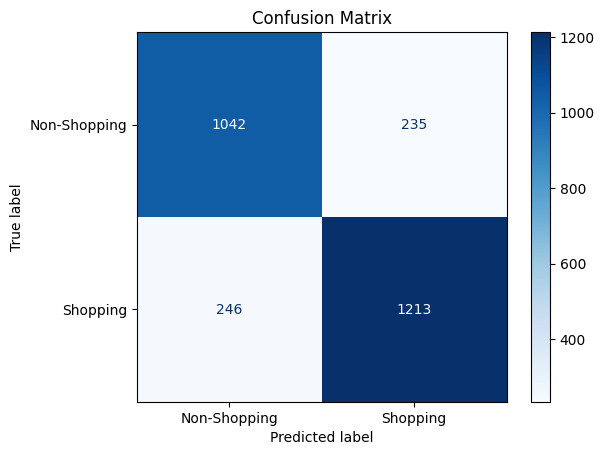

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

def plot_confusion_matrix(true_labels, predicted_labels, class_names):
    cm = confusion_matrix(true_labels, predicted_labels)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
    disp.plot(cmap=plt.cm.Blues)
    plt.title('Confusion Matrix')
    plt.show()

# Assuming you have the true labels and predicted labels from the evaluation
true_labels = test_labels
predicted_labels = test_preds
class_names = ['Non-Shopping', 'Shopping']

plot_confusion_matrix(true_labels, predicted_labels, class_names)